## Submitted MBHB results regarding the sky location

In [1]:
################ *** General for the plots *** ################
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline

# plt.style.use(['seaborn-ticks','seaborn-deep'])
plt.style.use(['seaborn-v0_8-ticks','seaborn-v0_8-deep'])

rcparams = {
          'axes.labelsize': 8,
          'font.size': 10,
          'legend.fontsize': 8,
          'xtick.color': 'k',
          'xtick.labelsize': 8,
          'ytick.color': 'k',
          'ytick.labelsize': 8,
          'text.usetex': False,
          'font.family': 'Times New Roman',
          'font.sans-serif': 'Bitstream Vera Sans',
          'mathtext.fontset': 'stixsans',
          'text.color': 'k',
          'figure.figsize': [12, 7],
          'figure.dpi': 900,
          'axes.grid' : True
          }

rcparams['axes.linewidth'] = 0.5

mpl.rcParams.update(rcparams)
############################################################

In [2]:
##########################################################
import numpy as np
import os
import sys

import ldc.io.hdf5 as h5io # reading h5 file
import pandas as pd       # pandas for data-tables

%load_ext autoreload
%autoreload 2

################## *** LISA constants *** ##################
import lisaconstants as constants
light = constants.C
YRSID_SI = constants.SIDEREALYEAR_J2000DAY*24*60*60
PARSEC_METER = constants.PARSEC_METER
MTsun = constants.GM_SUN/constants.SPEED_OF_LIGHT**3
AU = constants.ASTRONOMICAL_UNIT/light
Gpct = 1.e9*constants.PARSEC_METER/constants.SPEED_OF_LIGHT
############################################################

### Reading Sangria MBHB params

These are our injected sources.

In [3]:
sangria_fl = '/Users/asasli/Projects/LISA/Sangria/LDC2_sangria_training_v2.h5'
mbhb_sangria, mbhb_units = h5io.load_array(sangria_fl, name="sky/mbhb/cat")
MBHB_data = pd.DataFrame(mbhb_sangria)

In [4]:
mbhb_units

{'CoalescenceTime': 's',
 'Distance': 'Mpc',
 'EclipticLatitude': 'rad',
 'EclipticLongitude': 'rad',
 'Inclination': 'rad',
 'InitialAzimuthalAngleL': 'rad',
 'InitialPolarAngleL': 'rad',
 'Mass1': 'Msun',
 'Mass2': 'Msun',
 'PhaseAtCoalescence': 'rad',
 'PolarAngleOfSpin1': 'rad',
 'PolarAngleOfSpin2': 'rad',
 'Polarization': 'rad',
 'Redshift': '1',
 'Spin1': '1',
 'Spin2': '1'}

In [5]:
MBHB_data

,EclipticLatitude,EclipticLongitude,PolarAngleOfSpin1,PolarAngleOfSpin2,Spin1,Spin2,Mass1,Mass2,CoalescenceTime,PhaseAtCoalescence,InitialPolarAngleL,InitialAzimuthalAngleL,Redshift,Distance,ObservationDuration,Cadence
0,-0.564102,0.610927,0.908972,1.181699,0.972661,0.972862,1.015522e+06,7.968491e+05,4.800021e+06,4.275929,2.577539,4.094550,2.18186,17758.367941,3.155815e+07,3.0
1,-1.081082,4.052963,2.354232,1.689765,0.742128,0.989247,4.956676e+06,4.067167e+06,8.746488e+06,3.783309,0.963586,3.636925,6.17688,61097.116076,3.155815e+07,3.0
2,0.636028,0.779159,2.332027,2.065443,0.574122,0.592671,1.773563e+06,1.083356e+06,1.116784e+07,2.311127,0.232802,3.798411,6.03496,59472.237592,3.155815e+07,3.0
3,-0.878570,4.549720,2.068669,1.097989,0.942824,0.870789,9.159926e+05,7.017527e+05,1.125857e+07,1.150360,1.899782,5.829771,1.10396,7705.852640,3.155815e+07,3.0
4,-0.303004,1.292518,1.203136,2.097304,0.747377,0.838800,1.323277e+06,6.124855e+05,1.152694e+07,1.220197,2.691982,1.808398,1.73941,13470.983559,3.155815e+07,3.0
5,0.147296,5.986230,2.434152,1.926613,0.745574,0.546848,2.830218e+06,2.322253e+06,1.197096e+07,4.111379,1.131250,4.319761,5.50770,53474.693790,3.155815e+07,3.0
6,-0.987304,3.886726,2.594339,1.719446,0.829141,0.972219,3.204750e+06,3.056613e+06,1.361711e+07,3.628682,2.050928,1.084370,2.87966,24829.137775,3.155815e+07,3.0
7,0.917031,3.584892,1.665850,2.092903,0.988778,0.975945,1.856420e+06,1.801541e+06,1.653219e+07,1.866057,1.410068,0.527915,4.57261,43010.925050,3.155815e+07,3.0
8,0.835250,3.257316,2.362671,1.539846,0.833674,0.981901,3.983915e+06,2.049535e+06,1.724516e+07,1.578620,2.323179,3.643228,3.34910,29747.551597,3.155815e+07,3.0
9,-0.521369,3.085541,2.582941,2.200156,0.825883,0.811360,3.128823e+06,2.640346e+06,1.860576e+07,3.425317,2.604701,1.670016,7.21026,73048.167218,3.155815e+07,3.0


#### Needed Data

In [6]:
# ecliptic coordinate system
# Ecliptic longitude (\lambda); measured along the ecliptic from the vernal equinox
# Ecliptic latitude (\beta); measured perpendicular to the ecliptic
def sky_SourceDic(x, name='MBHB'):
    y = {}
    y['lambda'] = (x["EclipticLongitude"])% (2 * np.pi)  # should be in (0,2*pi)
    y['beta']   = x['EclipticLatitude']
    y['D']      = x['Distance']
    
    return y

In [7]:
sources = sky_SourceDic(mbhb_sangria, name='MBHB')

In [8]:
# labels and true values
lbls = [r'$\lambda$', r'$\beta$', r'$D$']
true_vals = np.array([sources['lambda'], sources['beta'], sources['D']]).T

### 1) Submission - L2IT

In [9]:
import glob
L2IT_dir = '/Users/asasli/Projects/LISA/Sangria/submissions/L2IT-APC/Noise_MBHBs/'
L2IT_fls = glob.glob(L2IT_dir+'*csv')
L2IT_dat = []
for ii in range(len(L2IT_fls)):
    fl = L2IT_dir + 'mbhb-'+str(ii)+'-pdf.csv'
    if fl not in L2IT_fls:
        print (fl, 'no found')
    else:
        dat = np.genfromtxt(fl, delimiter=",", names=True)
        L2IT_dat.append(dat)
print (len(L2IT_dat))  ### should be sorted

/Users/asasli/Projects/LISA/Sangria/submissions/L2IT-APC/Noise_MBHBs/mbhb-15-pdf.csv no found
/Users/asasli/Projects/LISA/Sangria/submissions/L2IT-APC/Noise_MBHBs/mbhb-16-pdf.csv no found
15


In [10]:
print (L2IT_dat[0].dtype)

[('Mass1', '<f8'), ('Mass2', '<f8'), ('Spin1', '<f8'), ('Spin2', '<f8'), ('Tc', '<f8'), ('DL', '<f8'), ('Incl', '<f8'), ('EclLat', '<f8'), ('EclLong', '<f8'), ('Pol', '<f8'), ('PhC', '<f8')]


In [11]:
def L2IT_sky(LA):
    sub_LA = np.zeros( (len(LA), len(lbls)) )
    
    sub_LA[:,0]  = (LA["EclLong"])% (2 * np.pi)
    sub_LA[:,1]  = LA['EclLat']
    sub_LA[:,2]  = LA['DL']
    
    return sub_LA

Load modules for sky maps:

In [21]:
# Show current directory
current_directory = os.getcwd()
print("Current Directory:", current_directory)

# Add src directory
src_directory = os.path.abspath(os.path.join(current_directory, os.pardir, "src"))
sys.path.append(src_directory)
print("Added src Directory:", src_directory)

from sky_utils import *

Current Directory: /Users/asasli/Projects/LISAsky/test
Added src Directory: /Users/asasli/Projects/LISAsky/src


```frame='galactic'``` (better represantation for galactic binaries - here, we use just the posteriors of the SMBHB training set)

In [13]:
# write fits files and specify the directory
dirname = '/Users/asasli/Projects/LISA/Sangria/Results/L2IT/galactic/'
# uncomment loop if you want to write the fits files for every ID
# and make the sky maps
#for ID in range(0, 15):
    # load samples
    #samples = np.array(L2IT_sky(L2IT_dat[ID]))
    #distances = samples[:,2]  
    ## convert to icrs (or galactic)
    #converted = convert_to_frame_from_ecliptic(samples, frame='icrs')
    #pts = np.column_stack((converted[:,0], converted[:,1], samples[:,2]))
    ## true values
    #mbh_case = true_vals[ID]
    #dist = mbh_case[-1]
    #mbh_case_reshaped = mbh_case.reshape(1, 3)
    #true_sky = convert_to_frame_from_ecliptic(mbh_case_reshaped, frame='galactic')
    #write_maps_fits(pts, 
    #            dirname=dirname, 
    #            name=ID, trials=5, jobs=8)
    # now plot the skymaps
    #fits_filename = dirname+'/{}_skymap.fits'.format((str(ID)))
    #plot_skymaps(ra, dec, dist, chains=None, 
    #             dirname=dirname, name=ID, fits_filename=fits_filename,
    #             figwidth = 3.5, dpi=300, 
    #             contour_levels=None, frame='icrs', transparent=True)

# Let's write the fits for one case:
# load samples
ID=14
samples = np.array(L2IT_sky(L2IT_dat[ID]))
distances = samples[:,2]  
## convert to galactic
converted = convert_to_frame_from_ecliptic(samples, frame='galactic')
pts = np.column_stack((converted[:,0], converted[:,1], samples[:,2]))
## true values
mbh_case = true_vals[ID]
dist = mbh_case[-1]
mbh_case_reshaped = mbh_case.reshape(1, 3)
true_sky = convert_to_frame_from_ecliptic(mbh_case_reshaped, frame='galactic')
# write fits files
write_maps_fits(pts, 
            dirname=dirname, 
            name=ID, trials=5, jobs=8)

/Users/asasli/miniconda/envs/LISA_LDC/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loading existing skypost
adaptive refinement round 1 of 7 ...
adaptive refinement round 2 of 7 ...
adaptive refinement round 3 of 7 ...
adaptive refinement round 4 of 7 ...
adaptive refinement round 5 of 7 ...
adaptive refinement round 6 of 7 ...
adaptive refinement round 7 of 7 ...
evaluating distance layers ...


100%|██████████| 16896/16896 [01:58<00:00, 142.24it/s]


Starting volumetric image...
> Marginalize onto the given faces...
>> Plotting projection 1
>> Plotting projection 2
>> Plotting projection 3
Plotting distance
Image saved at /Users/asasli/Projects/LISA/Sangria/Results/L2IT/galactic//figs/volume_skymap_14.pdf
Plotting 2D map in astro hours mollweide projection


/Users/asasli/miniconda/envs/LISA_LDC/lib/python3.8/site-packages/ligo/skymap/plot/util.py:53: UserWarning: FixedFormatter should only be used together with FixedLocator
  axis.set_ticklabels(ticklabels)


Image saved at /Users/asasli/Projects/LISA/Sangria/Results/L2IT/galactic//figs/skymap_14.pdf


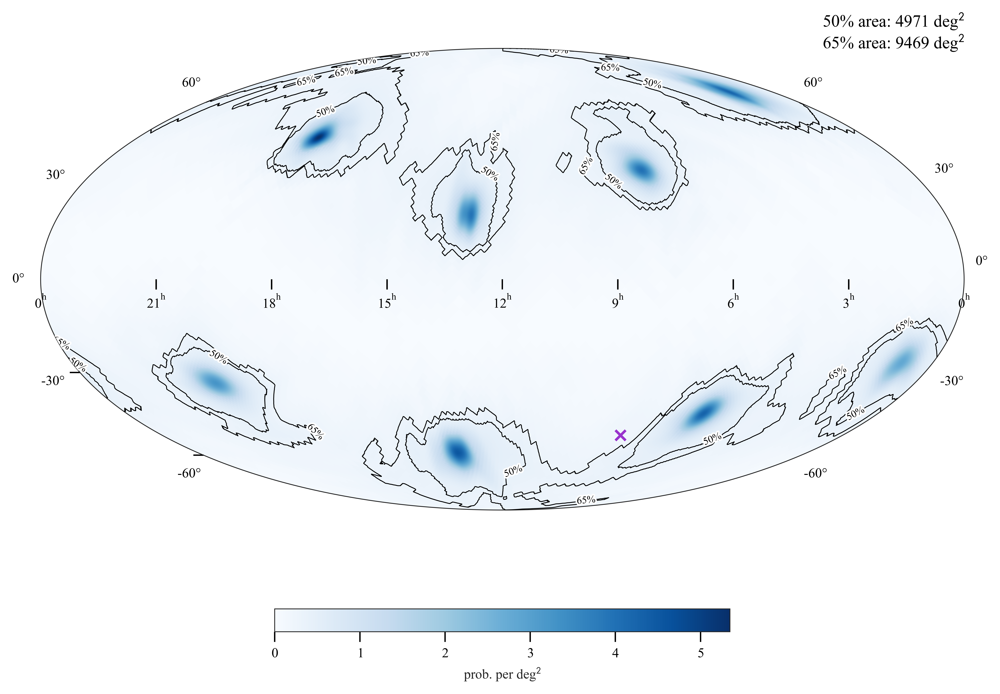

In [22]:
# fits have been saved under the name: dirname+'{}_skymap.fits'.format((str(ID)))
fits_filename = dirname+'/{}_skymap.fits'.format((str(ID)))
plot_skymaps(true_sky[0], dist, chains=None, 
                 dirname=dirname, name=ID, fits_filename=fits_filename,
                 figwidth = 3.5, dpi=900, 
                 contour_levels=None, frame='galactic', transparent=True)

```frame='icrs'```

In [24]:
dirname = '/Users/asasli/Projects/LISA/Sangria/Results/L2IT/'
# Let's write the fits for one case:
# load samples
ID=14
samples = np.array(L2IT_sky(L2IT_dat[ID]))
distances = samples[:,2]  
## convert to icrs
converted = convert_to_frame_from_ecliptic(samples)
pts = np.column_stack((converted[:,0], converted[:,1], samples[:,2]))
## true values
mbh_case = true_vals[ID]
dist = mbh_case[-1]
mbh_case_reshaped = mbh_case.reshape(1, 3)
true_sky = convert_to_frame_from_ecliptic(mbh_case_reshaped)
# write fits files
write_maps_fits(pts, 
            dirname=dirname, 
            name=ID, trials=5, jobs=8)

100%|██████████| 200/200 [13:02<00:00,  3.91s/it]


adaptive refinement round 1 of 7 ...
adaptive refinement round 2 of 7 ...
adaptive refinement round 3 of 7 ...
adaptive refinement round 4 of 7 ...
adaptive refinement round 5 of 7 ...
adaptive refinement round 6 of 7 ...
adaptive refinement round 7 of 7 ...
evaluating distance layers ...


100%|██████████| 16896/16896 [00:55<00:00, 306.80it/s]


Starting volumetric image...
> Marginalize onto the given faces...
>> Plotting projection 1
>> Plotting projection 2
>> Plotting projection 3
Plotting distance
Image saved at /Users/asasli/Projects/LISA/Sangria/Results/L2IT//figs/volume_skymap_14.pdf
Plotting 2D map in astro hours mollweide projection


/Users/asasli/miniconda/envs/LISA_LDC/lib/python3.8/site-packages/ligo/skymap/plot/util.py:53: UserWarning: FixedFormatter should only be used together with FixedLocator
  axis.set_ticklabels(ticklabels)


Image saved at /Users/asasli/Projects/LISA/Sangria/Results/L2IT//figs/skymap_14.pdf


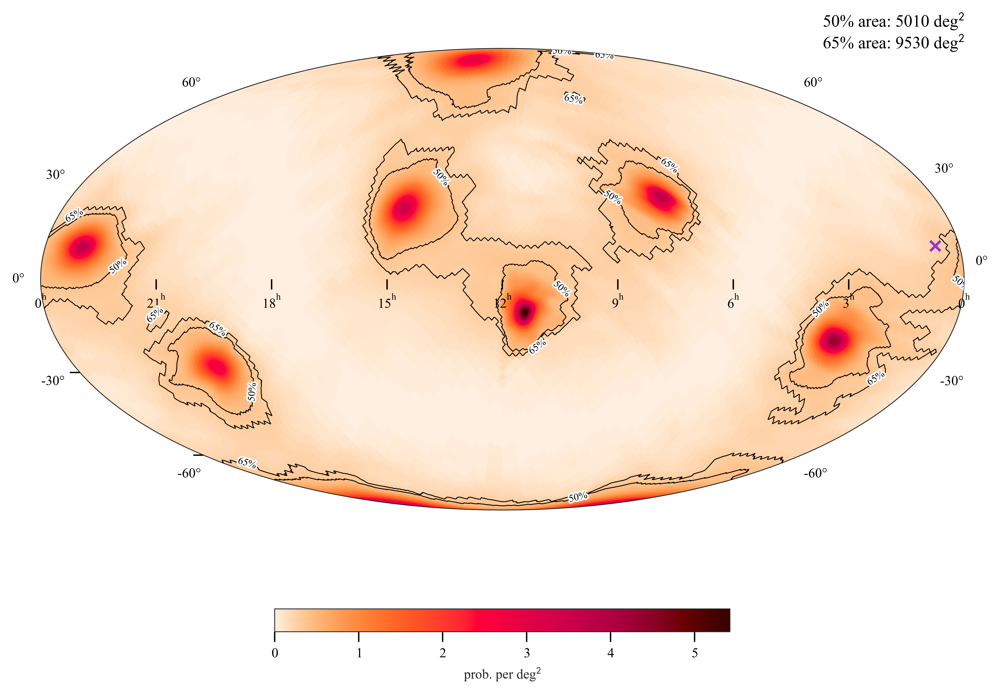

In [25]:
# fits have been saved under the name: dirname+'{}_skymap.fits'.format((str(ID)))
fits_filename = dirname+'/{}_skymap.fits'.format((str(ID)))
plot_skymaps(true_sky[0], dist, chains=None, 
                 dirname=dirname, name=ID, fits_filename=fits_filename,
                 figwidth = 3.5, dpi=900, 
                 contour_levels=None, frame='icrs', transparent=True)